AMAANY (23031554038)

NURIN NASI'AH SALSABILA (23031554148)

# **LOAD** **DATA**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import librosa
import librosa.display
import warnings
warnings.filterwarnings('ignore')

from IPython.display import Audio
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import librosa
import librosa.display
import warnings
warnings.filterwarnings('ignore')

from IPython.display import Audio
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

dataset_path = '/content/drive/MyDrive/BoneFractureYolo8'

In [4]:
for root, dirs, files in os.walk(dataset_path):
    print(f'📂 Folder: {root}')
    for file in files:
        print(f'   └── 📄 {file}')

Output streaming akan dipotong hingga 5000 baris terakhir.
   └── 📄 image1_1989_png.rf.195bebb5a51e04b09e659727ce555acc.jpg
   └── 📄 image1_1968_png.rf.96dc036da87b84d5b403d23c1b40ef47.jpg
   └── 📄 image1_19_png.rf.d1beafa2c4e533e5901c39f42503efbb.jpg
   └── 📄 image1_19_png.rf.411be835296e6ec4d442bc2790029fd1.jpg
   └── 📄 image1_19_png.rf.bf54a53b761fc76dd5d627b8bcfe8160.jpg
   └── 📄 image1_196_png.rf.61e9f3a67f3c73784277cb6ef6d292d7.jpg
   └── 📄 image1_1964_png.rf.1f80ff9665341f4fc0ba0e006085893f.jpg
   └── 📄 image1_199_png.rf.57bfb31415dd1c67a1a741f2b4d40c7d.jpg
   └── 📄 image1_1986_png.rf.d2704ad85f8101bb1def8a6c232bd37f.jpg
   └── 📄 image1_1968_png.rf.d7d7d22ed450b61fda81dc03d3f8760e.jpg
   └── 📄 image1_195_png.rf.cd24fe5aa4c058c67ecab36a2741db89.jpg
   └── 📄 image1_200_png.rf.88278827c0dad232ffb9bf96c1d3b96d.jpg
   └── 📄 image1_198_png.rf.b6ee755ac568d1156710b658727d07ac.jpg
   └── 📄 image1_19_png.rf.4c38f47cd15918399dd75ebf5cfc6f73.jpg
   └── 📄 image1_1_png.rf.86bfeaf79dab0628174

#TITIK PATAH TULANG DIAMBIL DARI LABEL


In [20]:
def process_and_visualize_with_polygon(folder_path, label_folder, image_size=(256, 256), n_visualize=5):
    import os
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt
    import random

    valid_ext = ('.jpg', '.jpeg', '.png')
    all_images = [f for f in os.listdir(folder_path) if f.endswith(valid_ext)]

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    processed_data = []

    for img_name in all_images:
        img_path = os.path.join(folder_path, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            continue  # skip corrupted/unreadable images

        # Simpan ukuran asli untuk referensi jika diperlukan
        orig_h, orig_w = img.shape[:2]

        # Resize untuk pemrosesan & visualisasi
        img_resized = cv2.resize(img, image_size)
        img_clahe = clahe.apply(img_resized)

        h, w = image_size
        mask = np.zeros((h, w), dtype=np.uint8)
        center = (w // 2, h // 2)
        radius = min(center[0], center[1], w - center[0], h - center[1])
        cv2.circle(mask, center, radius, 255, -1)
        img_masked = cv2.bitwise_and(img_clahe, img_clahe, mask=mask)

        edges = cv2.Canny(img_masked, 30, 100)
        kernel = np.ones((3, 3), np.uint8)
        edges_dilated = cv2.dilate(edges, kernel, iterations=1)

        # Gambar polygon dari label
        boxed_image = cv2.cvtColor(img_resized, cv2.COLOR_GRAY2BGR)
        label_name = os.path.splitext(img_name)[0] + '.txt'
        label_path = os.path.join(label_folder, label_name)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = list(map(float, line.strip().split()))
                    if len(parts) >= 3:
                        coords = parts[1:]  # skip class_id
                        if len(coords) % 2 == 0:
                            # Konversi koordinat relatif ke piksel (pada ukuran yang sudah di-resize)
                            points = []
                            for i in range(0, len(coords), 2):
                                x = int(coords[i] * w)
                                y = int(coords[i + 1] * h)
                                points.append([x, y])
                            points = np.array([points], dtype=np.int32)
                            cv2.polylines(boxed_image, points, isClosed=True, color=(0, 255, 0), thickness=2)

        processed_data.append({
            'original': img_resized,
            'clahe': img_clahe,
            'masked': img_masked,
            'edges': edges,
            'edges_dilated': edges_dilated,
            'boxed': boxed_image,
            'path': img_path
        })

    # Visualisasi
    sample_data = random.sample(processed_data, min(n_visualize, len(processed_data)))
    fig, axs = plt.subplots(len(sample_data), 5, figsize=(20, 5 * len(sample_data)))

    for i, data in enumerate(sample_data):
        axs[i, 0].imshow(data['original'], cmap='gray')
        axs[i, 0].set_title(f'Original: {os.path.basename(data["path"])}')

        axs[i, 1].imshow(data['clahe'], cmap='gray')
        axs[i, 1].set_title('CLAHE')

        axs[i, 2].imshow(data['masked'], cmap='gray')
        axs[i, 2].set_title('Masked CLAHE')

        axs[i, 3].imshow(data['edges_dilated'], cmap='gray')
        axs[i, 3].set_title('Canny + Dilate')

        axs[i, 4].imshow(cv2.cvtColor(data['boxed'], cv2.COLOR_BGR2RGB))
        axs[i, 4].set_title('Bounding Polygon')

        for j in range(5):
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

    return processed_data


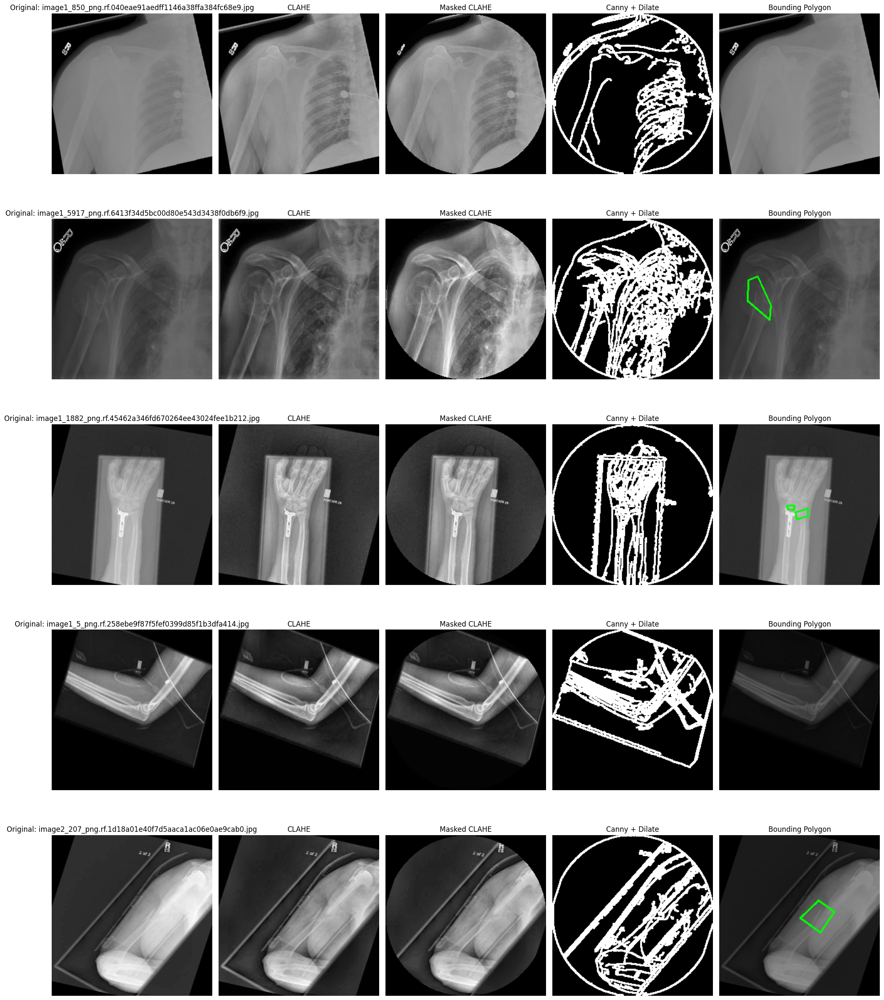

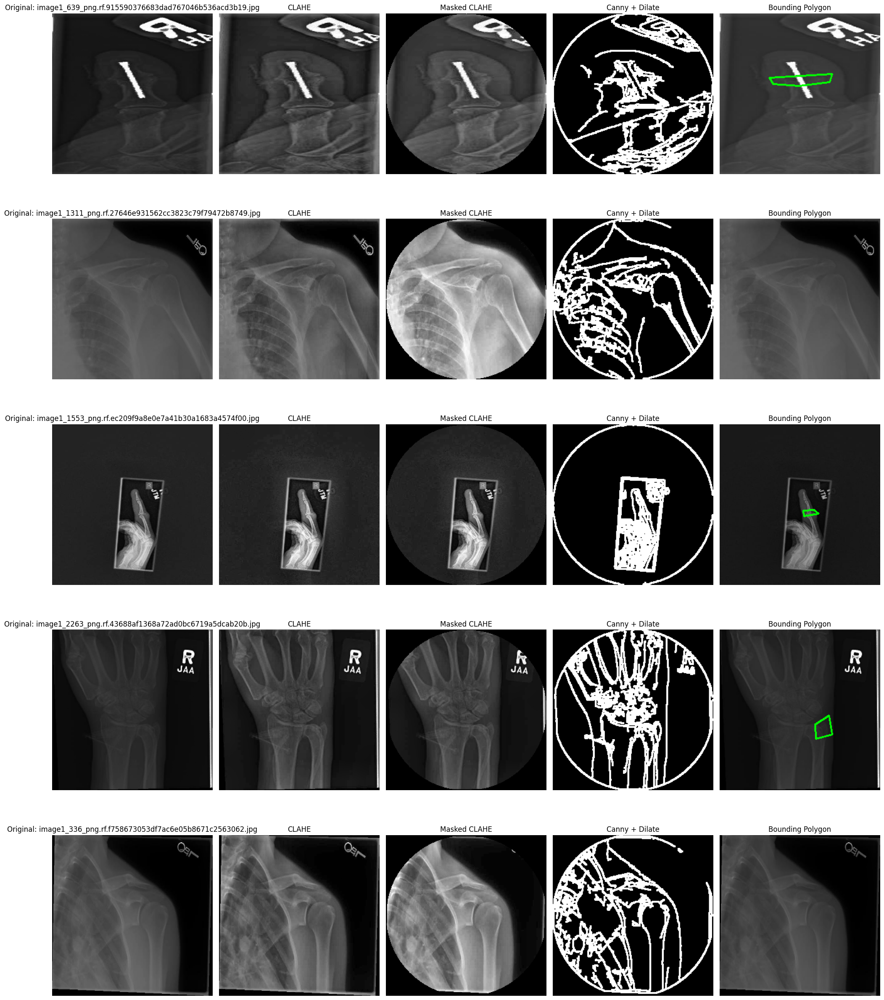

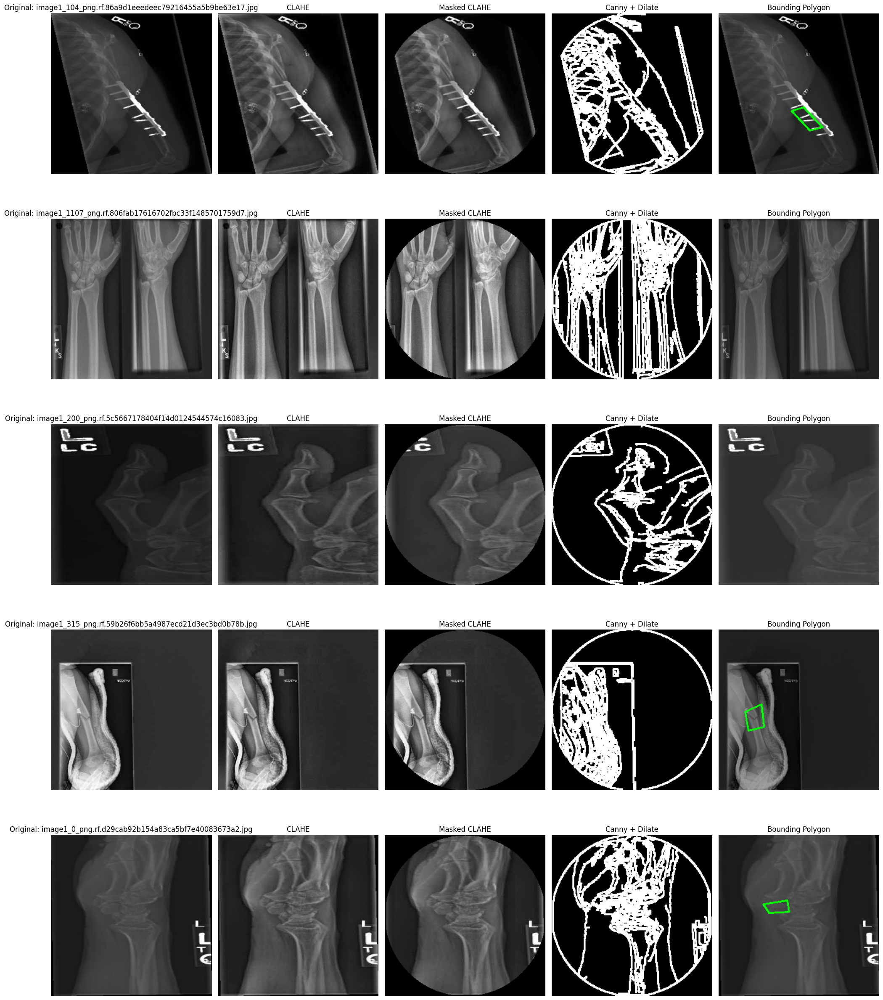

In [9]:
processed_train = process_and_visualize_with_polygon(
    folder_path='/content/drive/MyDrive/BoneFractureYolo8/train/images',
    label_folder='/content/drive/MyDrive/BoneFractureYolo8/train/labels',
    n_visualize=5
)

processed_test = process_and_visualize_with_polygon(
    folder_path='/content/drive/MyDrive/BoneFractureYolo8/test/images',
    label_folder='/content/drive/MyDrive/BoneFractureYolo8/test/labels',
    n_visualize=5
)

processed_valid = process_and_visualize_with_polygon(
    folder_path='/content/drive/MyDrive/BoneFractureYolo8/valid/images',
    label_folder='/content/drive/MyDrive/BoneFractureYolo8/valid/labels',
    n_visualize=5
)


#TITIK PATAH TULANG DIAMBIL DARI TEPI CANNY DAN KONTUR

In [29]:
def process_and_visualize_contour_based(folder_path, image_size=(256, 256), n_visualize=5):
    import os
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt
    import random

    valid_ext = ('.jpg', '.jpeg', '.png')
    all_images = [f for f in os.listdir(folder_path) if f.endswith(valid_ext)]

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    processed_data = []

    for img_name in all_images:
        img_path = os.path.join(folder_path, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            continue  # skip corrupted/unreadable images

        img_resized = cv2.resize(img, image_size)
        img_clahe = clahe.apply(img_resized)

        h, w = image_size
        mask = np.zeros((h, w), dtype=np.uint8)
        center = (w // 2, h // 2)
        radius = min(center[0], center[1], w - center[0], h - center[1])
        cv2.circle(mask, center, radius, 255, -1)
        img_masked = cv2.bitwise_and(img_clahe, img_clahe, mask=mask)

        edges = cv2.Canny(img_masked, 30, 100)
        kernel = np.ones((3, 3), np.uint8)
        edges_dilated = cv2.dilate(edges, kernel, iterations=1)

        # Kontur dari hasil edge
        contours, _ = cv2.findContours(edges_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        boxed_image = cv2.cvtColor(img_resized, cv2.COLOR_GRAY2BGR)
        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area > 50:  # Filter kontur kecil/noise
                approx = cv2.approxPolyDP(cnt, 0.02 * cv2.arcLength(cnt, True), True)
                cv2.polylines(boxed_image, [approx], isClosed=True, color=(0, 255, 255), thickness=2)

        processed_data.append({
            'original': img_resized,
            'clahe': img_clahe,
            'masked': img_masked,
            'edges': edges,
            'edges_dilated': edges_dilated,
            'boxed': boxed_image,
            'path': img_path
        })

    # Visualisasi
    sample_data = random.sample(processed_data, min(n_visualize, len(processed_data)))
    fig, axs = plt.subplots(len(sample_data), 5, figsize=(20, 5 * len(sample_data)))

    for i, data in enumerate(sample_data):
        axs[i, 0].imshow(data['original'], cmap='gray')
        axs[i, 0].set_title(f'Original: {os.path.basename(data["path"])}')

        axs[i, 1].imshow(data['clahe'], cmap='gray')
        axs[i, 1].set_title('CLAHE')

        axs[i, 2].imshow(data['masked'], cmap='gray')
        axs[i, 2].set_title('Masked CLAHE')

        axs[i, 3].imshow(data['edges_dilated'], cmap='gray')
        axs[i, 3].set_title('Canny + Dilate')

        axs[i, 4].imshow(cv2.cvtColor(data['boxed'], cv2.COLOR_BGR2RGB))
        axs[i, 4].set_title('Contours as Polygons')

        for j in range(5):
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

    return processed_data


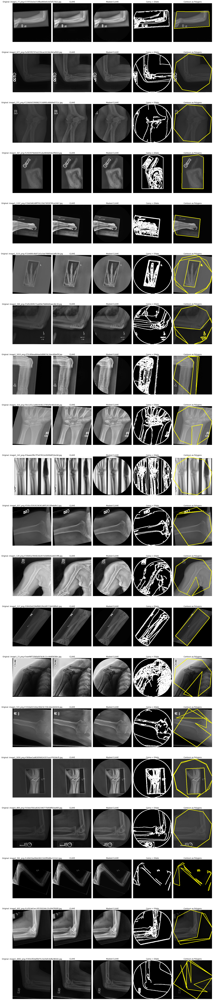

In [30]:
processed_train = process_and_visualize_contour_based(
    folder_path='/content/drive/MyDrive/BoneFractureYolo8/train/images',
    n_visualize=20
)
